In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os

In [3]:
dataset_path = 'C:/Users/jonghui/Downloads/DressCode/upper_body/images/'

img_list = []
for img in os.listdir(dataset_path):
    if img.endswith("1.jpg"):
        img_list.append(img)

print(img_list)
len(img_list)

['000000_1.jpg', '000001_1.jpg', '000002_1.jpg', '000003_1.jpg', '000004_1.jpg', '000005_1.jpg', '000006_1.jpg', '000007_1.jpg', '000008_1.jpg', '000009_1.jpg', '000010_1.jpg', '000011_1.jpg', '000012_1.jpg', '000013_1.jpg', '000014_1.jpg', '000015_1.jpg', '000016_1.jpg', '000017_1.jpg', '000018_1.jpg', '000019_1.jpg', '000020_1.jpg', '000021_1.jpg', '000022_1.jpg', '000023_1.jpg', '000024_1.jpg', '000025_1.jpg', '000026_1.jpg', '000027_1.jpg', '000028_1.jpg', '000029_1.jpg', '000030_1.jpg', '000031_1.jpg', '000032_1.jpg', '000033_1.jpg', '000034_1.jpg', '000035_1.jpg', '000036_1.jpg', '000037_1.jpg', '000038_1.jpg', '000039_1.jpg', '000040_1.jpg', '000041_1.jpg', '000042_1.jpg', '000043_1.jpg', '000044_1.jpg', '000045_1.jpg', '000046_1.jpg', '000047_1.jpg', '000048_1.jpg', '000049_1.jpg', '000050_1.jpg', '000051_1.jpg', '000052_1.jpg', '000053_1.jpg', '000054_1.jpg', '000055_1.jpg', '000056_1.jpg', '000057_1.jpg', '000058_1.jpg', '000059_1.jpg', '000060_1.jpg', '000061_1.jpg', '000062

15363

In [2]:
dataset_path = "C:/Users/jonghui/Downloads/DressCode/cloth/upper_body/"

img_list = []
for img in os.listdir(dataset_path):
    if img.endswith("1.jpg"):
        img_list.append(img)

print(img_list)

['000000_1.jpg', '000001_1.jpg', '000002_1.jpg', '000003_1.jpg', '000004_1.jpg', '000005_1.jpg', '000006_1.jpg', '000007_1.jpg', '000008_1.jpg', '000009_1.jpg', '000010_1.jpg', '000011_1.jpg', '000012_1.jpg', '000013_1.jpg', '000014_1.jpg', '000015_1.jpg', '000016_1.jpg', '000017_1.jpg', '000018_1.jpg', '000019_1.jpg', '000020_1.jpg', '000021_1.jpg', '000022_1.jpg', '000023_1.jpg', '000024_1.jpg', '000025_1.jpg', '000026_1.jpg', '000027_1.jpg', '000028_1.jpg', '000029_1.jpg', '000030_1.jpg', '000031_1.jpg', '000032_1.jpg', '000033_1.jpg', '000034_1.jpg', '000035_1.jpg', '000036_1.jpg', '000037_1.jpg', '000038_1.jpg', '000039_1.jpg', '000040_1.jpg', '000041_1.jpg', '000042_1.jpg', '000043_1.jpg', '000044_1.jpg', '000045_1.jpg', '000046_1.jpg', '000047_1.jpg', '000048_1.jpg', '000049_1.jpg', '000050_1.jpg', '000051_1.jpg', '000052_1.jpg', '000053_1.jpg', '000054_1.jpg', '000055_1.jpg', '000056_1.jpg', '000057_1.jpg', '000058_1.jpg', '000059_1.jpg', '000060_1.jpg', '000061_1.jpg', '000062

In [3]:
print(len(img_list))

15363


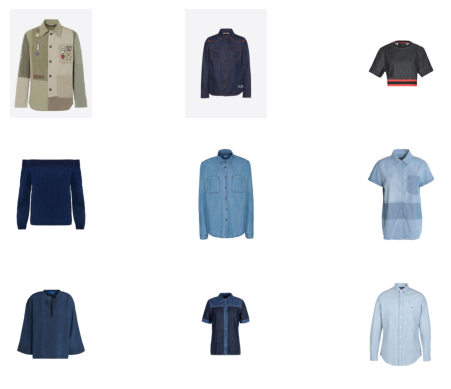

In [4]:
for i in range(3):
    for j in range(3):
        img = plt.imread(dataset_path + img_list[i*3+j])
        plt.subplot(3, 3, i*3+j+1)
        plt.axis('off')
        plt.imshow(img)

In [5]:
import os
from PIL import Image
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms

class CustomImageDataset(Dataset):
    def __init__(self, directory, transform=None):
        self.directory = directory
        self.transform = transform
        self.images = [f for f in os.listdir(directory) if os.path.isfile(os.path.join(directory, f))]

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_name = os.path.join(self.directory, self.images[idx])
        image = Image.open(img_name).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image

# Define transformations
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

dataset = CustomImageDataset(directory=dataset_path, transform=transform)

# Create a DataLoader
dataloader = DataLoader(dataset, batch_size=32, shuffle=False)

In [6]:
import torch
from torchvision.models import resnet50

# Initialize the pre-trained model
model = resnet50(pretrained=True)
model.eval()  # Set the model to evaluation mode

# Adapt the model to use it as a feature extractor
model = torch.nn.Sequential(*(list(model.children())[:-1]))

if torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")
model = model.to(device)

# Feature extraction function
def extract_features(dataloader, model, device):
    features = []
    with torch.no_grad():
        for inputs in dataloader:
            inputs = inputs.to(device)  # Move input data to the GPU
            outputs = model(inputs).flatten(start_dim=1)
            features.append(outputs.cpu().numpy())  # Move the tensors back to CPU for numpy conversion
    return np.concatenate(features, axis=0)

# Extract features
features = extract_features(dataloader, model, device)

c:\Users\jonghui\anaconda3\envs\torch_book\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\jonghui\anaconda3\envs\torch_book\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [1]:
features.shape

NameError: name 'features' is not defined

In [26]:
#save model
np.save('./features.npy', features)

In [27]:
from sklearn.cluster import KMeans

# Clustering
kmeans = KMeans(n_clusters=60, random_state=22)
clusters = kmeans.fit_predict(features)

In [28]:
print(len(clusters))
print(clusters)
print(len(set(clusters)))

15363
[50 10  8 ... 23  8 23]
60


In [65]:
cluster_groups = {0: [], 1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [], 9: []}
for i, cluster in enumerate(clusters):
    # print(i, cluster)
    if cluster not in cluster_groups:
        cluster_groups[cluster] = []
    
    cluster_groups[cluster].append(img_list[i])

In [66]:
print(cluster_groups.keys())

dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 50, 10, 18, 30, 40, 16, 52, 43, 38, 33, 59, 35, 13, 49, 51, 48, 15, 45, 47, 27, 57, 26, 28, 21, 39, 31, 12, 23, 11, 41, 42, 22, 37, 55, 25, 24, 36, 19, 46, 54, 32, 14, 56, 20, 17, 53, 34, 58, 44, 29])


In [67]:
def print_cluster_img(num):
    for i in range(15):
        img = plt.imread(dataset_path + cluster_groups[num][i])
        plt.subplot(3, 5, i+1)
        plt.axis('off')
        plt.imshow(img)

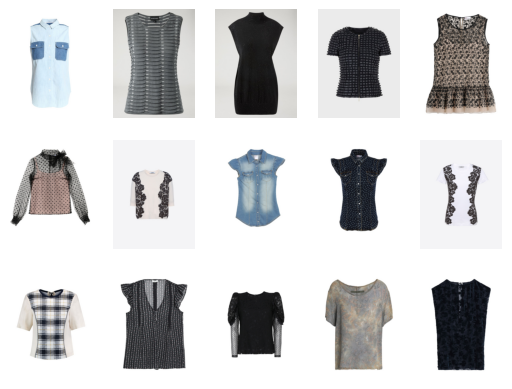

In [68]:
print_cluster_img(0)

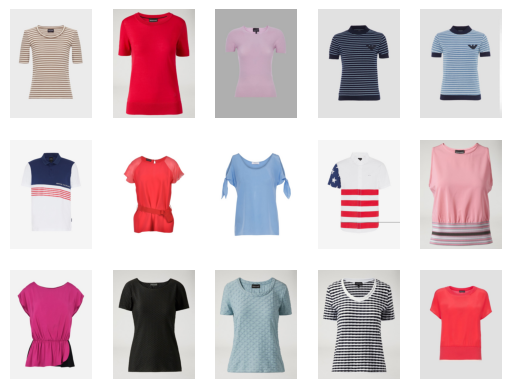

In [63]:
print_cluster_img(1)

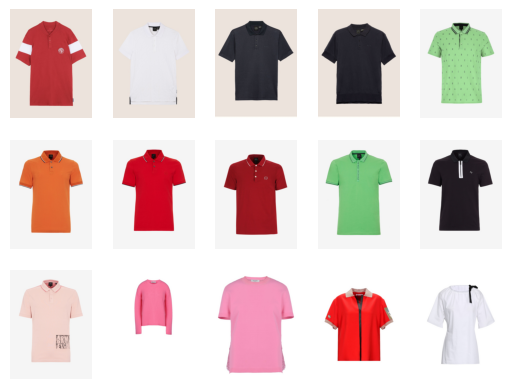

In [64]:
print_cluster_img(2)

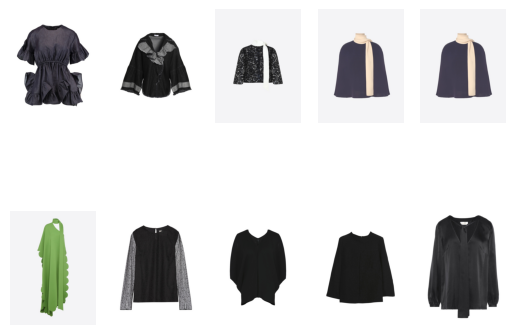

In [50]:
print_cluster_img(3)

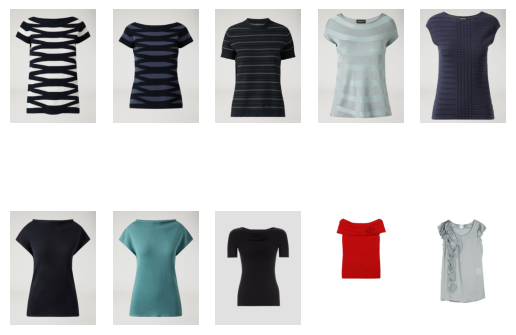

In [51]:
print_cluster_img(4)

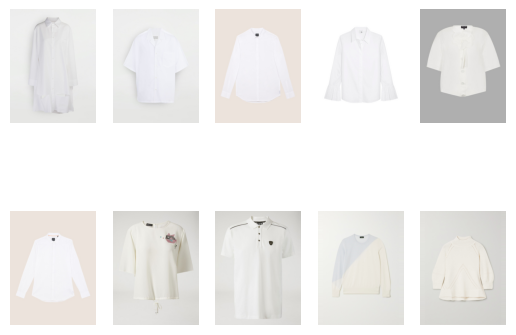

In [52]:
print_cluster_img(5)

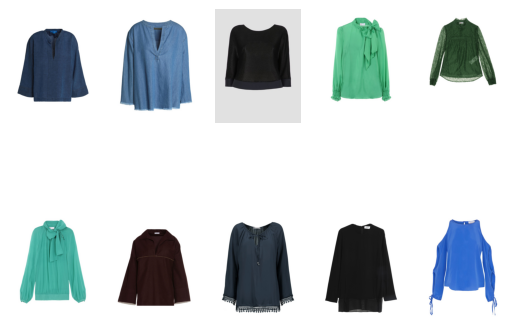

In [53]:
print_cluster_img(6)

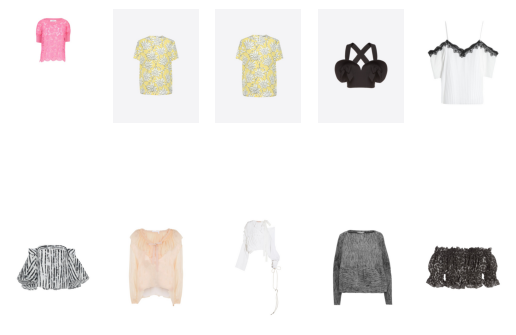

In [54]:
print_cluster_img(7)

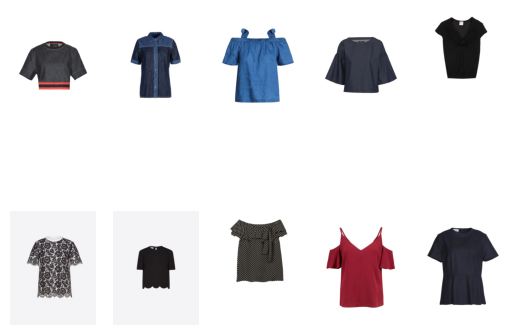

In [55]:
print_cluster_img(8)

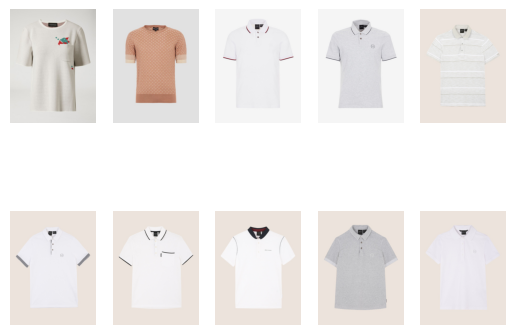

In [56]:
print_cluster_img(9)

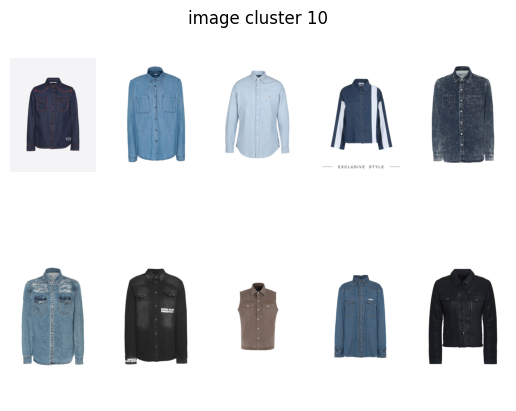

In [60]:
for i in range(10,11):
    plt.figure()
    plt.axis('off')
    plt.title(f'image cluster {i}')
    print_cluster_img(i)

In [69]:
from sklearn.cluster import KMeans

# Clustering
kmeans = KMeans(n_clusters=100, random_state=22)
clusters = kmeans.fit_predict(features)

In [70]:
print(len(clusters))
print(clusters)
print(len(set(clusters)))

15363
[50  6 85 ... 23 57 89]
100


In [71]:
cluster_groups = {0: [], 1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [], 9: []}
for i, cluster in enumerate(clusters):
    # print(i, cluster)
    if cluster not in cluster_groups:
        cluster_groups[cluster] = []
    
    cluster_groups[cluster].append(img_list[i])

In [72]:
def print_cluster_img(num):
    for i in range(15):
        img = plt.imread(dataset_path + cluster_groups[num][i])
        plt.subplot(3, 5, i+1)
        plt.axis('off')
        plt.imshow(img)

C:\Users\jonghui\AppData\Local\Temp\ipykernel_19576\1804572213.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


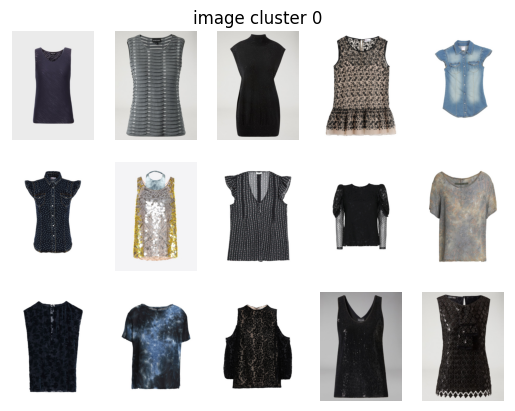

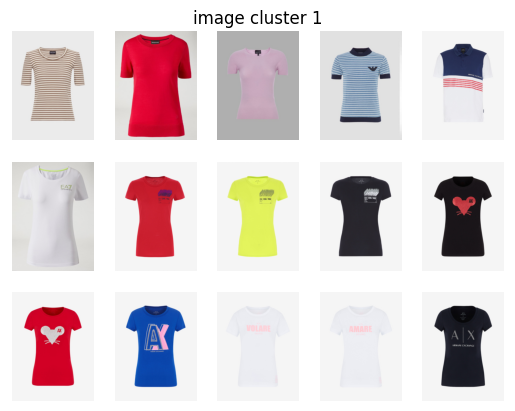

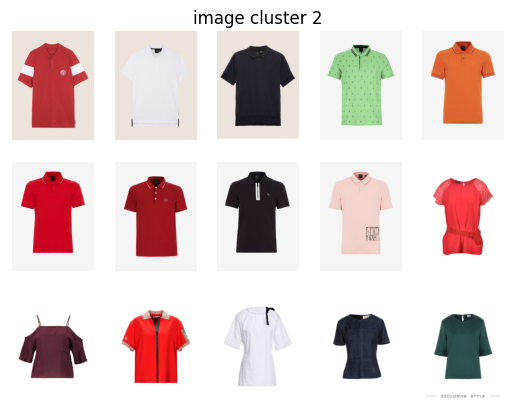

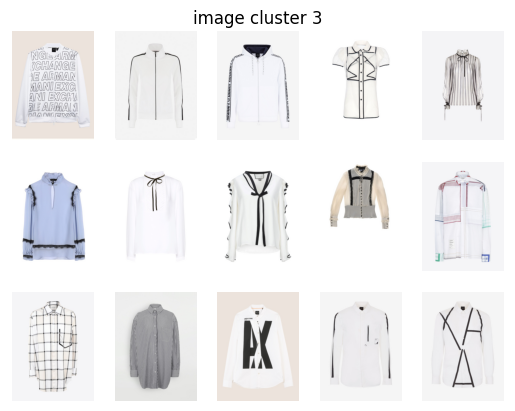

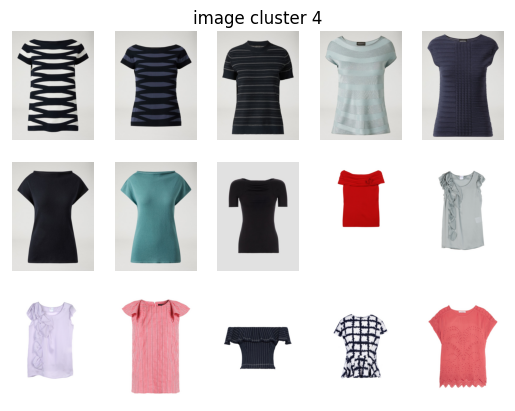

...

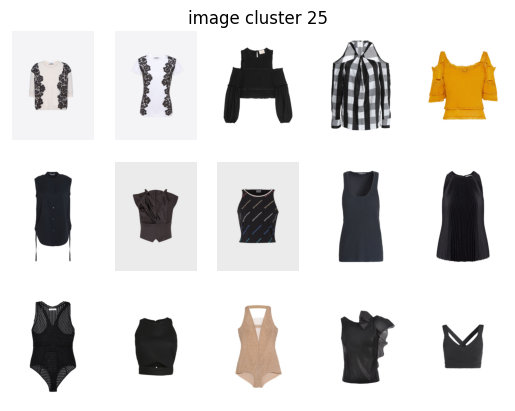

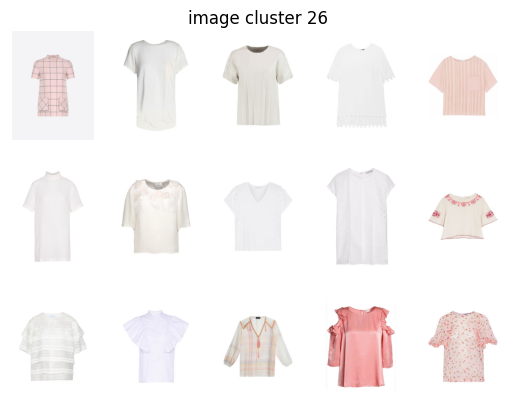

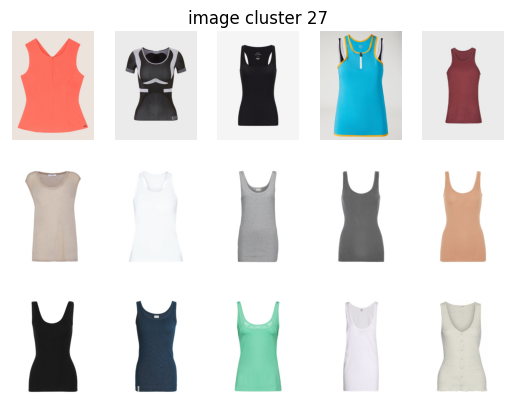

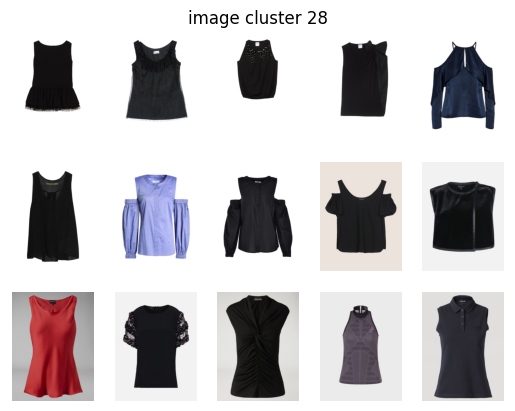

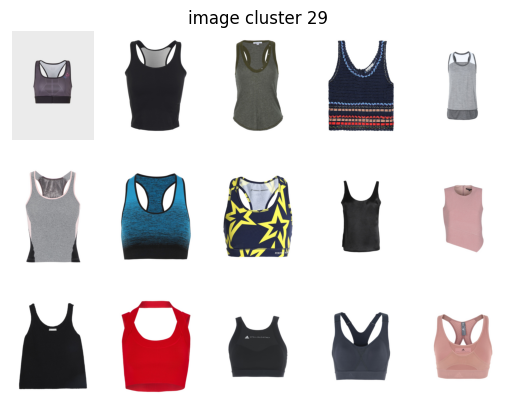

In [73]:
for i in range(30):
    plt.figure()
    plt.axis('off')
    plt.title(f'image cluster {i}')
    print_cluster_img(i)

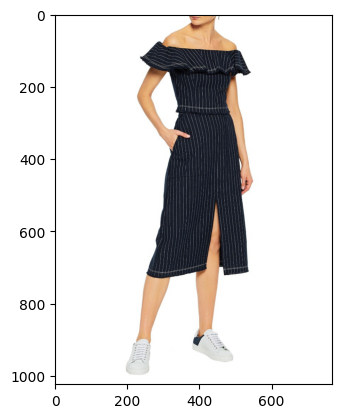

In [86]:
image_path = 'C:/Users/jonghui/Downloads/DressCode/upper_body/images/'
img = plt.imread(image_path + cluster_groups[4][12][:7] +'0.jpg')
plt.imshow(img)

In [82]:
cluster_groups[4][12][:7] +'1.jpg'

'000540_1.jpg'

In [87]:
from sklearn.cluster import KMeans

# Clustering
kmeans = KMeans(n_clusters=200, random_state=22)
clusters = kmeans.fit_predict(features)

In [88]:
print(len(clusters))
print(clusters)
print(len(set(clusters)))

15363
[188  47  27 ... 171 112  13]
200


In [89]:
cluster_groups = {0: [], 1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [], 9: []}
for i, cluster in enumerate(clusters):
    # print(i, cluster)
    if cluster not in cluster_groups:
        cluster_groups[cluster] = []
    
    cluster_groups[cluster].append(img_list[i])

In [90]:
def print_cluster_img(num):
    for i in range(15):
        img = plt.imread(dataset_path + cluster_groups[num][i])
        plt.subplot(3, 5, i+1)
        plt.axis('off')
        plt.imshow(img)

C:\Users\jonghui\AppData\Local\Temp\ipykernel_19576\1804572213.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


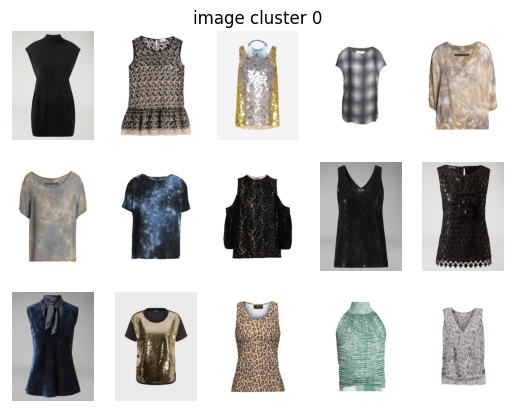

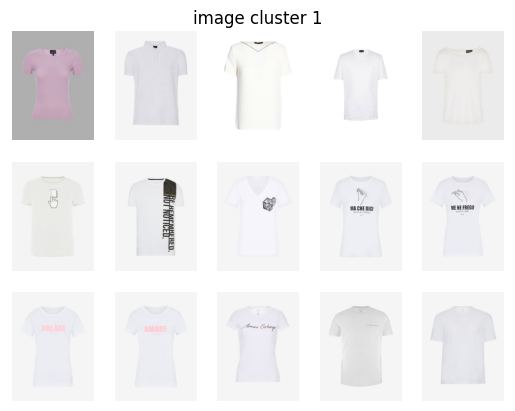

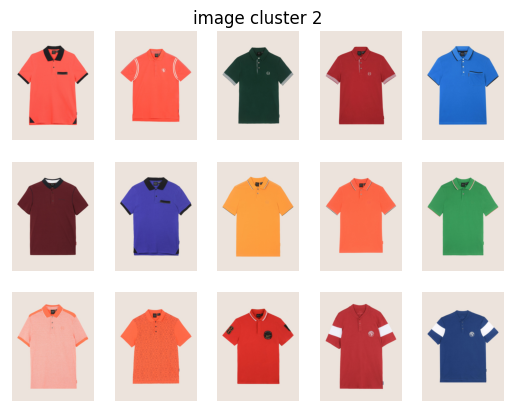

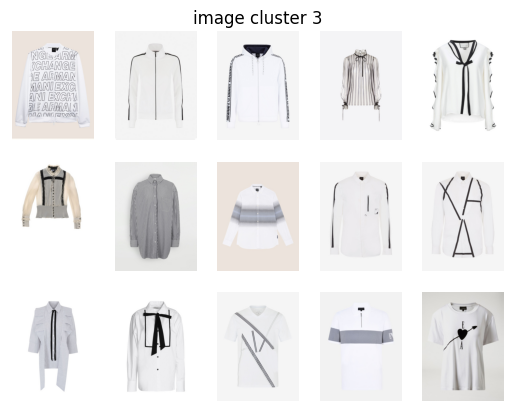

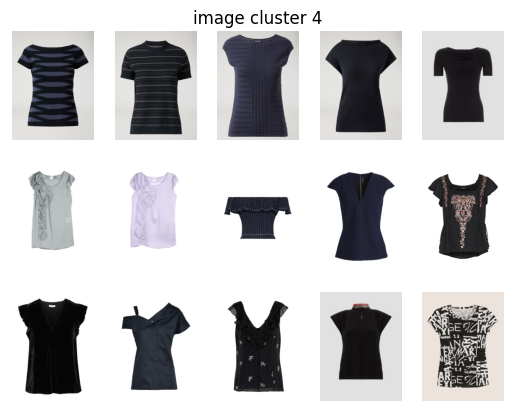

...

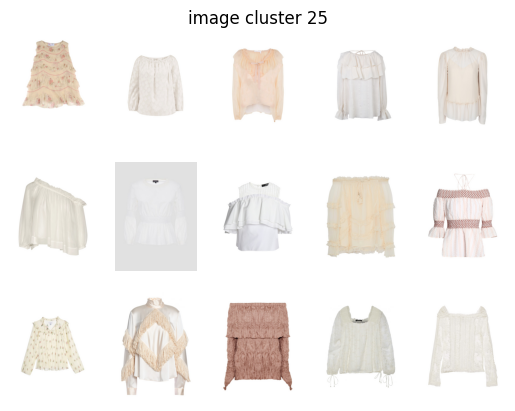

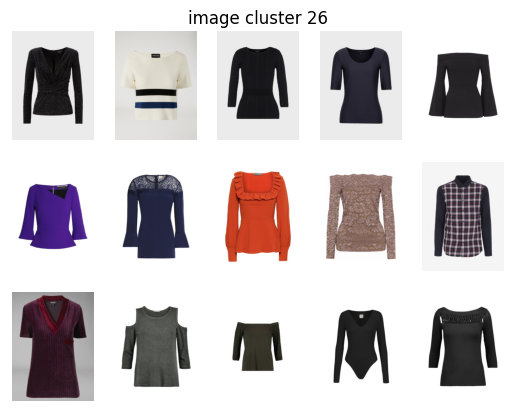

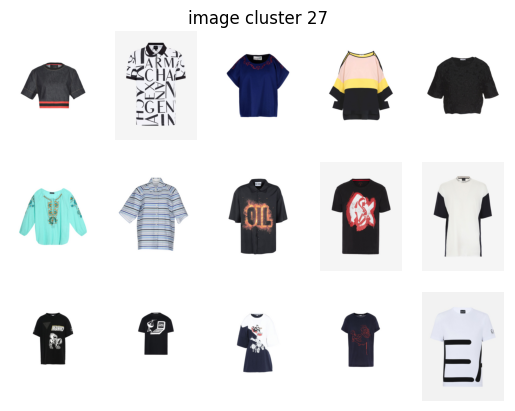

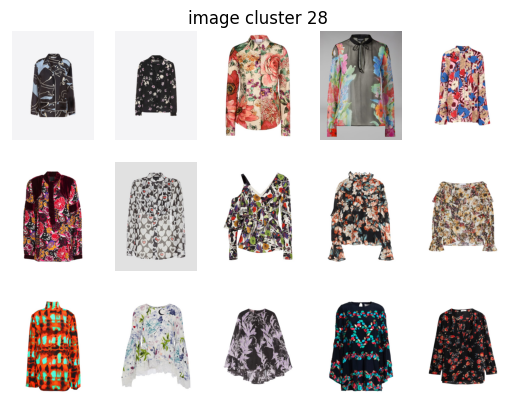

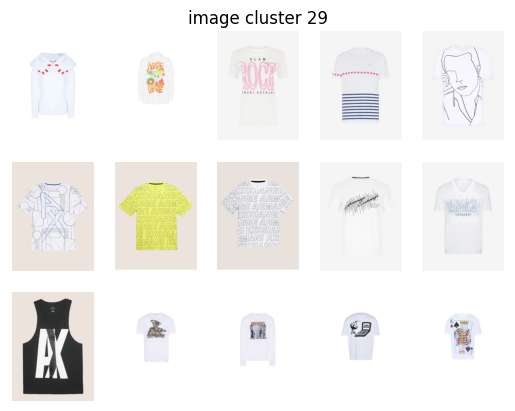

In [91]:
for i in range(30):
    plt.figure()
    plt.axis('off')
    plt.title(f'image cluster {i}')
    print_cluster_img(i)

In [92]:
dataset_path = "C:/Users/jonghui/Downloads/DressCode/cloth/lower_body/"

img_list = []
for img in os.listdir(dataset_path):
    if img.endswith("1.jpg"):
        img_list.append(img)

print(img_list)

['013563_1.jpg', '013564_1.jpg', '013565_1.jpg', '013566_1.jpg', '013567_1.jpg', '013568_1.jpg', '013569_1.jpg', '013570_1.jpg', '013571_1.jpg', '013572_1.jpg', '013573_1.jpg', '013574_1.jpg', '013575_1.jpg', '013576_1.jpg', '013577_1.jpg', '013578_1.jpg', '013579_1.jpg', '013580_1.jpg', '013581_1.jpg', '013582_1.jpg', '013583_1.jpg', '013584_1.jpg', '013585_1.jpg', '013586_1.jpg', '013587_1.jpg', '013588_1.jpg', '013589_1.jpg', '013590_1.jpg', '013591_1.jpg', '013592_1.jpg', '013593_1.jpg', '013594_1.jpg', '013595_1.jpg', '013596_1.jpg', '013597_1.jpg', '013598_1.jpg', '013599_1.jpg', '013600_1.jpg', '013601_1.jpg', '013602_1.jpg', '013603_1.jpg', '013604_1.jpg', '013605_1.jpg', '013606_1.jpg', '013607_1.jpg', '013608_1.jpg', '013609_1.jpg', '013610_1.jpg', '013611_1.jpg', '013612_1.jpg', '013613_1.jpg', '013614_1.jpg', '013615_1.jpg', '013616_1.jpg', '013617_1.jpg', '013618_1.jpg', '013619_1.jpg', '013620_1.jpg', '013621_1.jpg', '013622_1.jpg', '013623_1.jpg', '013624_1.jpg', '013625

In [93]:
print(len(img_list))

8951


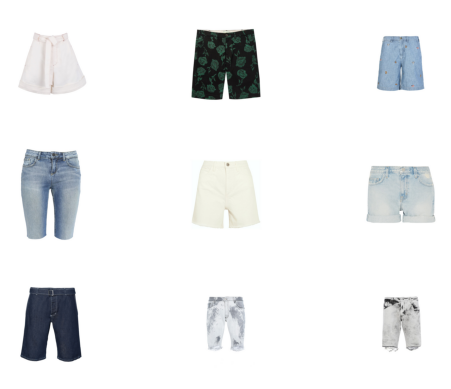

In [94]:
for i in range(3):
    for j in range(3):
        img = plt.imread(dataset_path + img_list[i*3+j])
        plt.subplot(3, 3, i*3+j+1)
        plt.axis('off')
        plt.imshow(img)

In [95]:
import os
from PIL import Image
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms

class CustomImageDataset(Dataset):
    def __init__(self, directory, transform=None):
        self.directory = directory
        self.transform = transform
        self.images = [f for f in os.listdir(directory) if os.path.isfile(os.path.join(directory, f))]

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_name = os.path.join(self.directory, self.images[idx])
        image = Image.open(img_name).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image

# Define transformations
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

dataset = CustomImageDataset(directory=dataset_path, transform=transform)

# Create a DataLoader
dataloader = DataLoader(dataset, batch_size=32, shuffle=False)

In [96]:
import torch
from torchvision.models import resnet50

# Initialize the pre-trained model
model = resnet50(pretrained=True)
model.eval()  # Set the model to evaluation mode

# Adapt the model to use it as a feature extractor
model = torch.nn.Sequential(*(list(model.children())[:-1]))

if torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")
model = model.to(device)

# Feature extraction function
def extract_features(dataloader, model, device):
    features = []
    with torch.no_grad():
        for inputs in dataloader:
            inputs = inputs.to(device)  # Move input data to the GPU
            outputs = model(inputs).flatten(start_dim=1)
            features.append(outputs.cpu().numpy())  # Move the tensors back to CPU for numpy conversion
    return np.concatenate(features, axis=0)

# Extract features
features = extract_features(dataloader, model, device)

c:\Users\jonghui\anaconda3\envs\torch_book\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\jonghui\anaconda3\envs\torch_book\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [97]:
#save model
np.save('./lower_features.npy', features)

In [98]:
from sklearn.cluster import KMeans

# Clustering
kmeans = KMeans(n_clusters=100, random_state=22)
clusters = kmeans.fit_predict(features)

In [99]:
print(len(clusters))
print(clusters)
print(len(set(clusters)))

8951
[34 16 51 ...  6 65 73]
100


In [100]:
cluster_groups = {0: [], 1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [], 9: []}
for i, cluster in enumerate(clusters):
    # print(i, cluster)
    if cluster not in cluster_groups:
        cluster_groups[cluster] = []
    
    cluster_groups[cluster].append(img_list[i])

In [101]:
def print_cluster_img(num):
    for i in range(15):
        img = plt.imread(dataset_path + cluster_groups[num][i])
        plt.subplot(3, 5, i+1)
        plt.axis('off')
        plt.imshow(img)

C:\Users\jonghui\AppData\Local\Temp\ipykernel_19576\1804572213.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


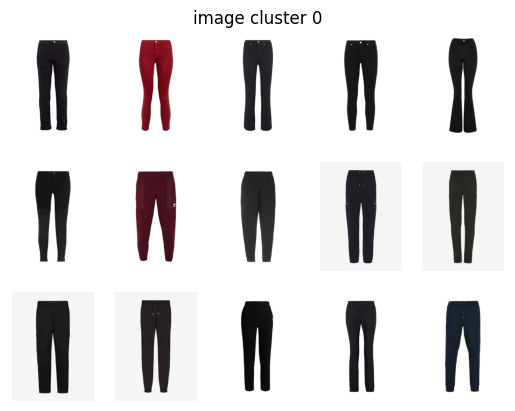

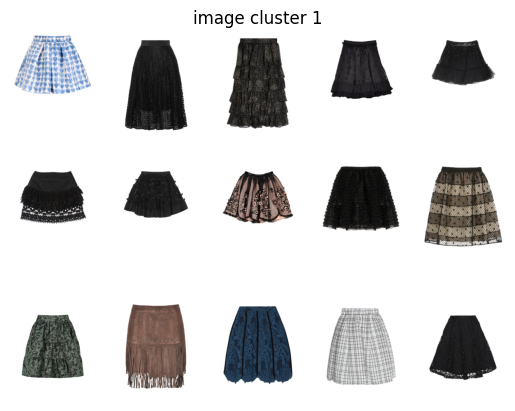

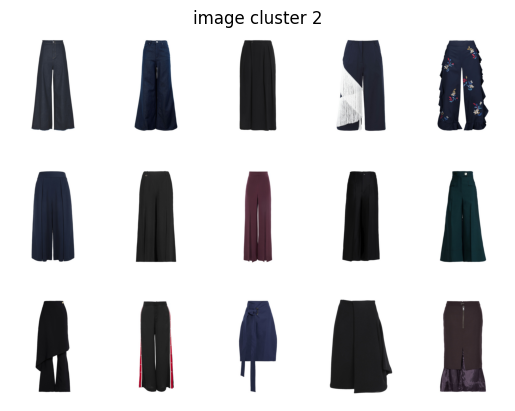

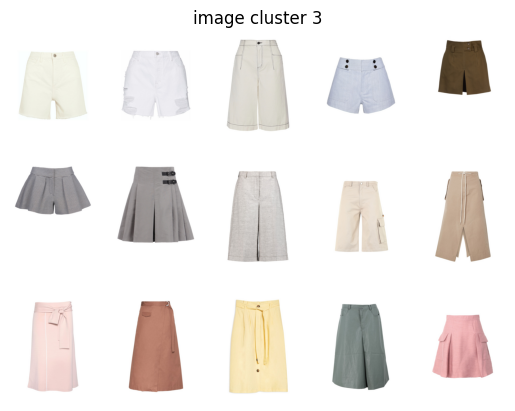

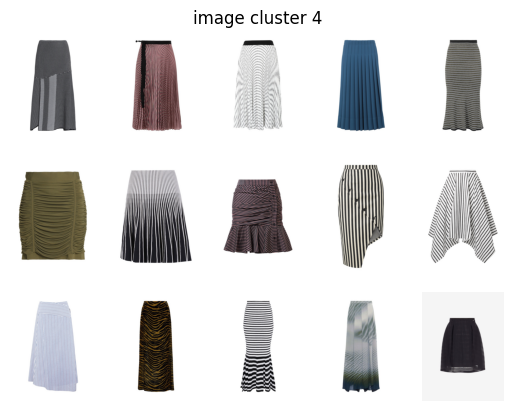

...

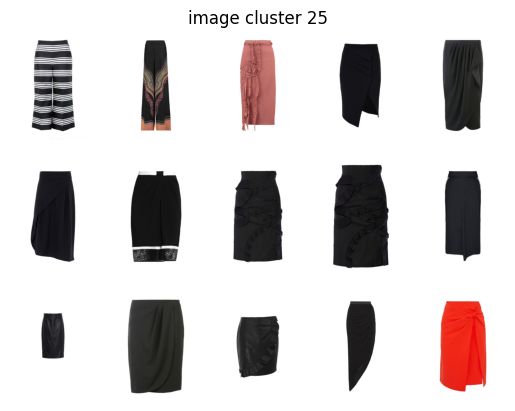

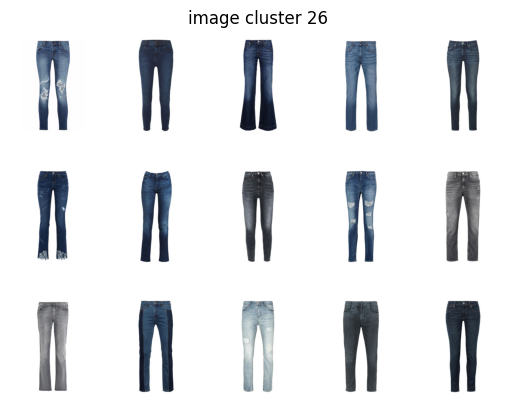

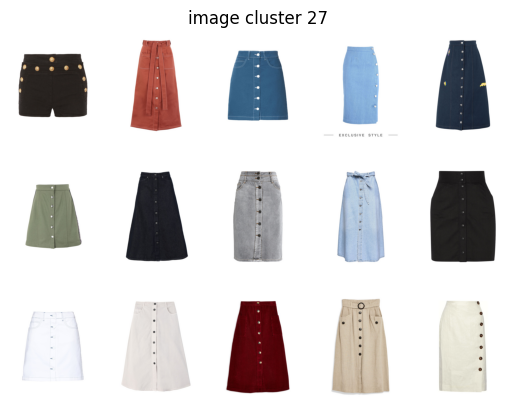

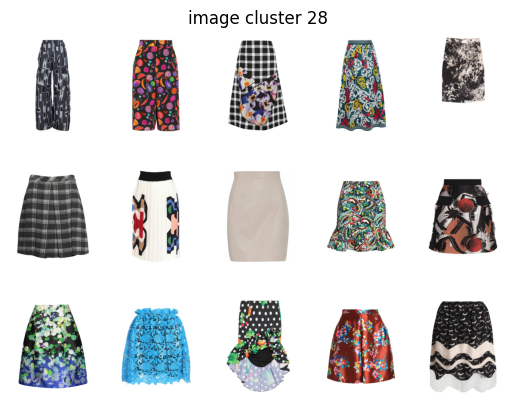

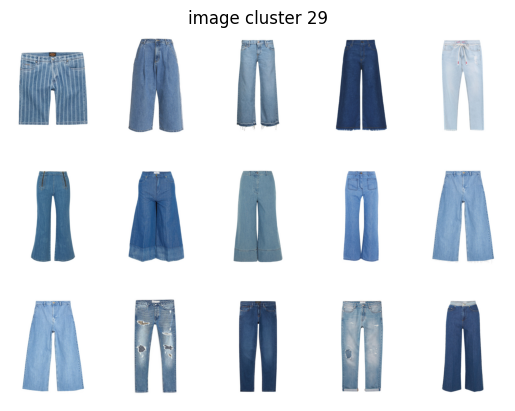

In [102]:
for i in range(30):
    plt.figure()
    plt.axis('off')
    plt.title(f'image cluster {i}')
    print_cluster_img(i)

In [103]:
dataset_path = "C:/Users/jonghui/Downloads/DressCode/cloth/dresses/"

img_list = []
for img in os.listdir(dataset_path):
    if img.endswith("1.jpg"):
        img_list.append(img)

print(img_list)

['020714_1.jpg', '020715_1.jpg', '020716_1.jpg', '020717_1.jpg', '020718_1.jpg', '020719_1.jpg', '020720_1.jpg', '020721_1.jpg', '020722_1.jpg', '020723_1.jpg', '020724_1.jpg', '020725_1.jpg', '020726_1.jpg', '020727_1.jpg', '020728_1.jpg', '020729_1.jpg', '020730_1.jpg', '020731_1.jpg', '020732_1.jpg', '020733_1.jpg', '020734_1.jpg', '020735_1.jpg', '020736_1.jpg', '020737_1.jpg', '020738_1.jpg', '020739_1.jpg', '020740_1.jpg', '020741_1.jpg', '020742_1.jpg', '020743_1.jpg', '020744_1.jpg', '020745_1.jpg', '020746_1.jpg', '020747_1.jpg', '020748_1.jpg', '020749_1.jpg', '020750_1.jpg', '020751_1.jpg', '020752_1.jpg', '020753_1.jpg', '020754_1.jpg', '020755_1.jpg', '020756_1.jpg', '020757_1.jpg', '020758_1.jpg', '020759_1.jpg', '020760_1.jpg', '020761_1.jpg', '020762_1.jpg', '020763_1.jpg', '020764_1.jpg', '020765_1.jpg', '020766_1.jpg', '020767_1.jpg', '020768_1.jpg', '020769_1.jpg', '020770_1.jpg', '020771_1.jpg', '020772_1.jpg', '020773_1.jpg', '020774_1.jpg', '020775_1.jpg', '020776

In [104]:
print(len(img_list))

29478


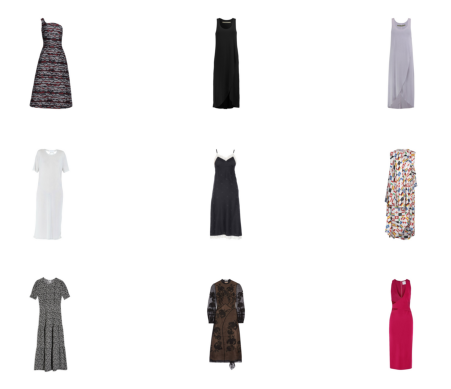

In [105]:
for i in range(3):
    for j in range(3):
        img = plt.imread(dataset_path + img_list[i*3+j])
        plt.subplot(3, 3, i*3+j+1)
        plt.axis('off')
        plt.imshow(img)

In [106]:
import os
from PIL import Image
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms

class CustomImageDataset(Dataset):
    def __init__(self, directory, transform=None):
        self.directory = directory
        self.transform = transform
        self.images = [f for f in os.listdir(directory) if os.path.isfile(os.path.join(directory, f))]

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_name = os.path.join(self.directory, self.images[idx])
        image = Image.open(img_name).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image

# Define transformations
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

dataset = CustomImageDataset(directory=dataset_path, transform=transform)

# Create a DataLoader
dataloader = DataLoader(dataset, batch_size=32, shuffle=False)

In [107]:
import torch
from torchvision.models import resnet50

# Initialize the pre-trained model
model = resnet50(pretrained=True)
model.eval()  # Set the model to evaluation mode

# Adapt the model to use it as a feature extractor
model = torch.nn.Sequential(*(list(model.children())[:-1]))

if torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")
model = model.to(device)

# Feature extraction function
def extract_features(dataloader, model, device):
    features = []
    with torch.no_grad():
        for inputs in dataloader:
            inputs = inputs.to(device)  # Move input data to the GPU
            outputs = model(inputs).flatten(start_dim=1)
            features.append(outputs.cpu().numpy())  # Move the tensors back to CPU for numpy conversion
    return np.concatenate(features, axis=0)

# Extract features
features = extract_features(dataloader, model, device)

c:\Users\jonghui\anaconda3\envs\torch_book\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\jonghui\anaconda3\envs\torch_book\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
#save model
np.save('./dress_features.npy', features)

In [ ]:
from sklearn.cluster import KMeans

# Clustering
kmeans = KMeans(n_clusters=100, random_state=22)
clusters = kmeans.fit_predict(features)

In [ ]:
print(len(clusters))
print(clusters)
print(len(set(clusters)))

15363
[188  47  27 ... 171 112  13]
200


In [ ]:
cluster_groups = {0: [], 1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [], 9: []}
for i, cluster in enumerate(clusters):
    # print(i, cluster)
    if cluster not in cluster_groups:
        cluster_groups[cluster] = []
    
    cluster_groups[cluster].append(img_list[i])

In [ ]:
def print_cluster_img(num):
    for i in range(15):
        img = plt.imread(dataset_path + cluster_groups[num][i])
        plt.subplot(3, 5, i+1)
        plt.axis('off')
        plt.imshow(img)

C:\Users\jonghui\AppData\Local\Temp\ipykernel_19576\1804572213.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


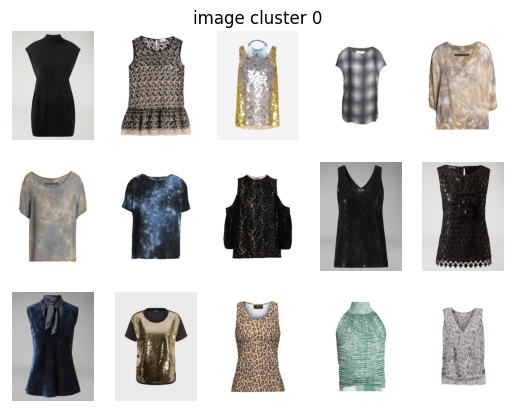

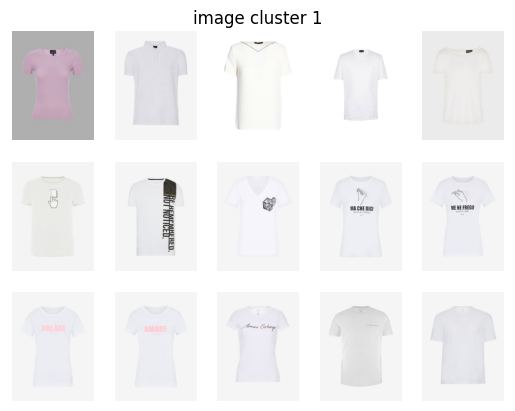

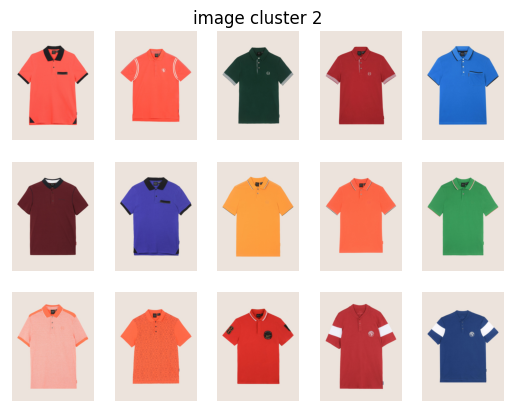

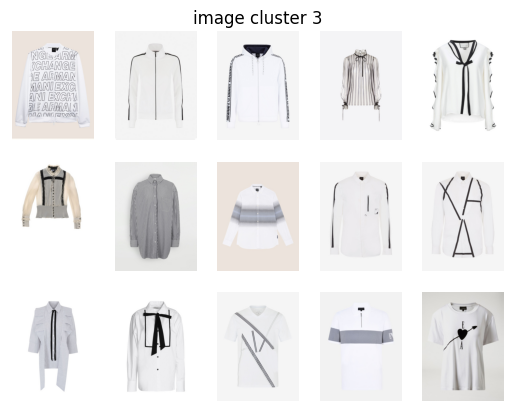

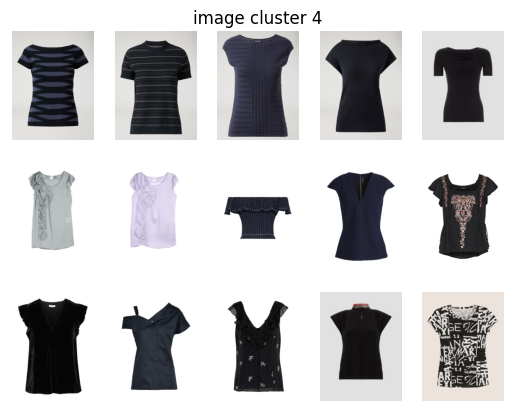

...

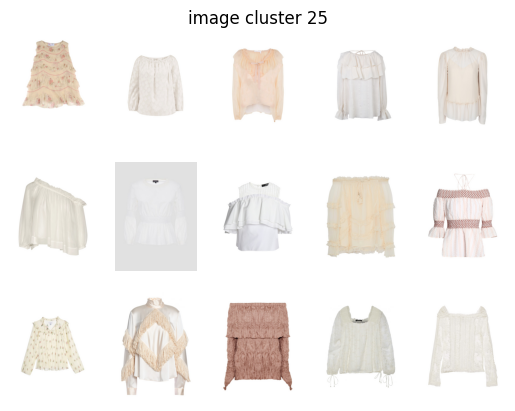

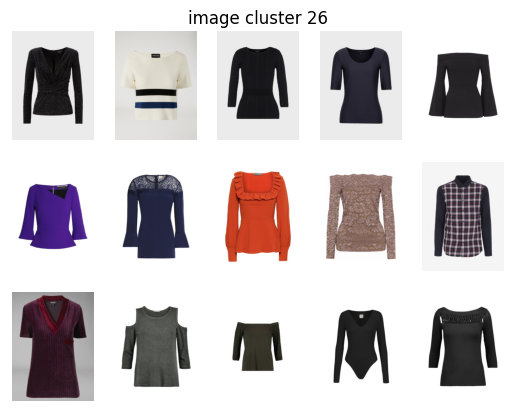

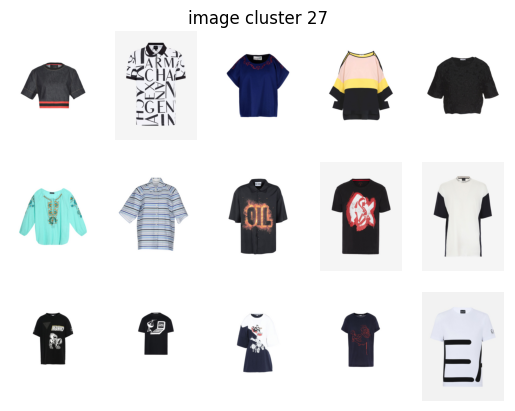

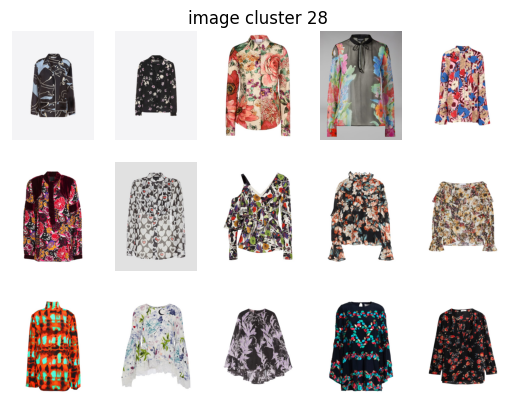

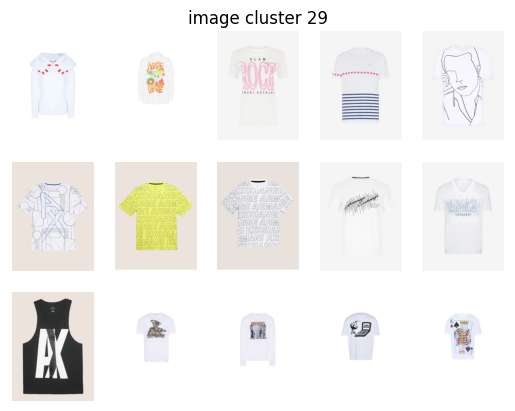

In [ ]:
for i in range(30):
    plt.figure()
    plt.axis('off')
    plt.title(f'image cluster {i}')
    print_cluster_img(i)